In [70]:
# nazimerensahin

In [64]:
# LIBROSA SİSTEMİNİN AKTARILMASI

import matplotlib.pyplot as plt # Grafik ve görselleştirme işlemleri için Matplotlib kütüphanesini yükler.
import numpy as np # Bilimsel hesaplama ve dizi işlemleri için NumPy kütüphanesini yükler.
import librosa # Ses işleme ve analiz için Librosa kütüphanesini yükler.
import librosa.display # Librosa’nın ses grafikleri çizme fonksiyonlarını yükler.
import pyloudnorm as pyln  # LUFS analizini yapar.
import IPython.display as ipd # Ses dosyalarını Jupyter'da çalmak için gerekli IPython fonksiyonlarını yükler.
from IPython.display import Audio, display  # Ses dosyalarını Jupyter hücresinde oynatmaya olanak tanır.


In [66]:
# SES DOSYALARININ AKTARILMASI

# Ses dosyalarının yerini belirleyip yükleme
sound1_file = "/Users/nazimerensahin/Desktop/drummer_ua_gray.wav" # İlk ses dosyası "sound1" olarak adlandırıldı.
sound2_file = "/Users/nazimerensahin/Desktop/drummer_waves.wav" # İkinci ses dosyası "sound2" olarak adlandırıldı.

# Ses dosyalarını librosa ile yükleme ve örnekleme oranlarını tanımlama
sound1, sr1 = librosa.load(sound1_file, sr=None)  # İlk ses dosyasını yükle
sound2, sr2 = librosa.load(sound2_file, sr=None)  # İkinci ses dosyasını yükle

# Ses dosyalarını alt alta oynatmak için listeleme
display(Audio(sound1_file), Audio(sound2_file))


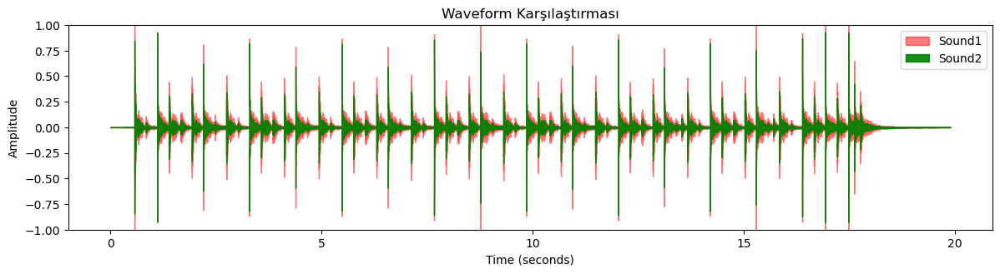

In [68]:
# WAVEFORM KARŞILAŞTIRMASI

plt.figure(figsize=(12, 6)) # Grafik için bir figür oluşturur ve boyutunu ayarlar.

plt.subplot(2, 1, 1) # Grafik penceresinde birden fazla alt grafik (subplot) oluşturmak için kullanılır.
librosa.display.waveshow(sound1, sr=sr1, alpha=0.5, color='red', label="Sound1") # İlk ses dalgasını çizer.

plt.subplot(2, 1, 1)
librosa.display.waveshow(sound2, sr=sr2, alpha=0.9, color='green', label="Sound2") # İkinci ses dalgası çizer.

# Başlık ve etiketler
plt.ylim((-1, 1)) # Y-ekseninin sınırlarını -1 ile 1 arasında ayarlar, böylece grafik dalga formunu uygun bir aralıkta gösterir.
plt.title("Waveform Karşılaştırması")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")

plt.legend(loc="upper right") # Grafik üzerindeki etiketlerin (label) sağ üst köşede gösterilmesini sağlar. 

plt.tight_layout() # Grafik ögelerinin düzenli ve sıkışık olmadan gösterilmesi için düzenlemeler yapar.
plt.show() # Grafiği ekrana çizer ve gösterir.

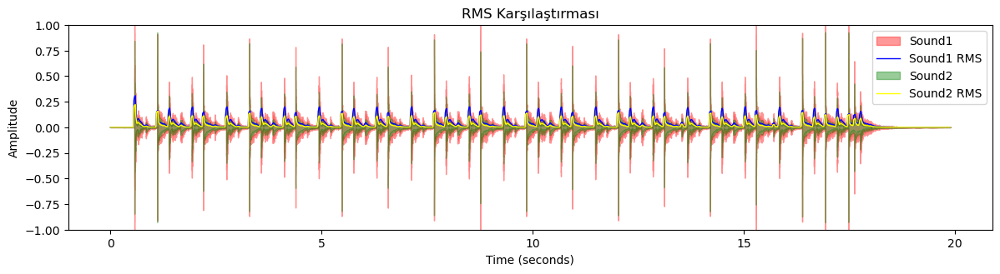

In [70]:
# RMS KARŞILAŞTIRMASI

# RMS hesaplama parametreleri
frame_length = 2048  # Her bir frame (çerçeve) için alınacak örnek sayısı
hop_length = 512     # Bir çerçeveden diğerine geçerken kaydırma miktarı

# Ses sinyalinin RMS değerini hesaplama
rms_sound1 = librosa.feature.rms(y=sound1, frame_length=frame_length, hop_length=hop_length)[0]
rms_sound2 = librosa.feature.rms(y=sound2, frame_length=frame_length, hop_length=hop_length)[0]

# Zaman vektörleri oluşturma
t_sound1 = librosa.times_like(rms_sound1, sr=sr1, hop_length=hop_length)
t_sound2 = librosa.times_like(rms_sound2, sr=sr2, hop_length=hop_length)

# Grafik çizimi
plt.figure(figsize=(12, 6))

# Ses dosyası 1 (UA Gray) grafik bilgileri
plt.subplot(2, 1, 1)
librosa.display.waveshow(sound1, sr=sr1, alpha=0.4, color='red', label="Sound1")
plt.plot(t_sound1, rms_sound1, color="blue", linewidth=1, label="Sound1 RMS")
plt.title("RMS Karşılaştırması")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.ylim((-1, 1))
plt.legend(loc="upper right")

# Ses dosyası 2 (Waves) grafik bilgileri
plt.subplot(2, 1, 1)
librosa.display.waveshow(sound2, sr=sr2, alpha=0.4, color='green', label="Sound2")
plt.plot(t_sound2, rms_sound2, color="yellow", linewidth=1, label="Sound2 RMS")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.ylim((-1, 1))
plt.legend(loc="upper right")

plt.tight_layout()
plt.show()

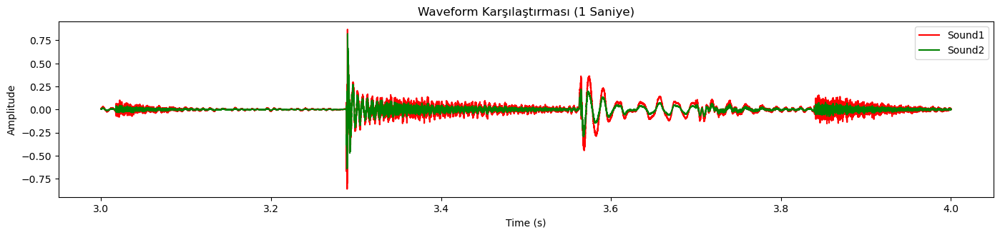

In [72]:
# WAVEFORM 1 SANİYELİK KISIM

# Belirtilen zaman dilimleri
start_time = 3  # Başlangıç zamanı (saniye) Grafik gösterimini 3. saniyeden başlatır.
end_time = 4    # Bitiş zamanı (saniye) Grafik gösterimini 4. saniyede bitirir.

# Ses dosyalarının örnekleme sayılarını hesaplama
start_sample1 = int(start_time * sr1)
end_sample1 = int(end_time * sr1)
start_sample2 = int(start_time * sr2)
end_sample2 = int(end_time * sr2)

# Ses dosyalarının ilgili bölümlerini alma
sound1_segment = sound1[start_sample1:end_sample1]
sound2_segment = sound2[start_sample2:end_sample2]

# Zaman eksenini oluşturma
time1 = np.linspace(start_time, end_time, len(sound1_segment))
time2 = np.linspace(start_time, end_time, len(sound2_segment))

# Grafiği oluşturma
plt.figure(figsize=(14, 6))

# İlk ses dosyası
plt.subplot(2, 1, 1)
plt.plot(time1, sound1_segment, label='Sound1', color='red')
plt.title('Sound 1 Waveform (3-4 seconds)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()
plt.legend()

# İkinci ses dosyası
plt.subplot(2, 1, 1)
plt.plot(time2, sound2_segment, label='Sound2', color='green')
plt.title('Waveform Karşılaştırması (1 Saniye)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

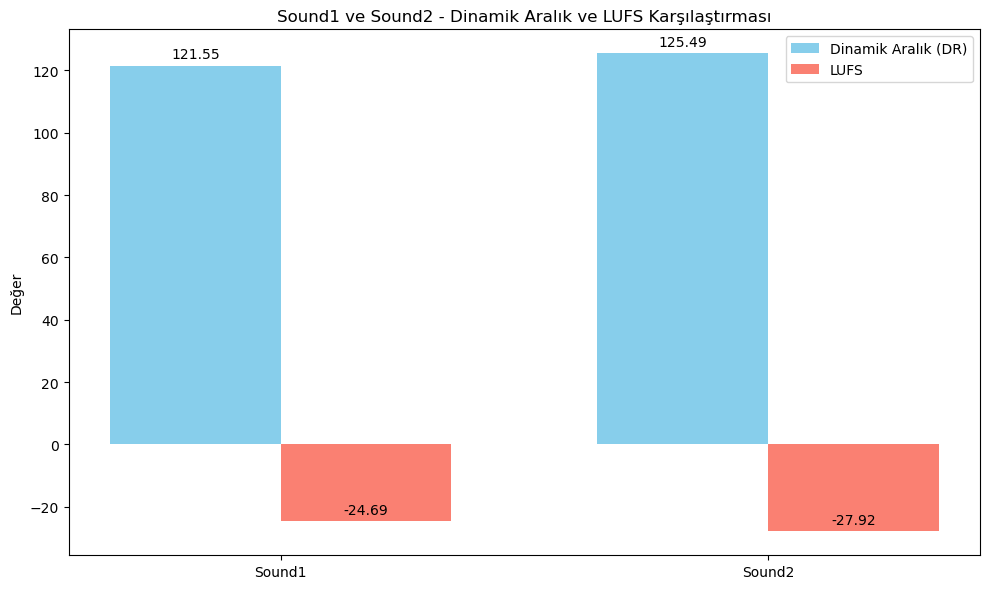

In [74]:
# DİNAMİK ALAN VE LUFS

# Dinamik Aralık (DR) Analizi
def calculate_dynamic_range(signal): # Sinyalin dinamik aralığını dB cinsinden hesaplar.
    rms = librosa.feature.rms(y=signal) # Sinyalin kök-ortalama-kare (RMS) değerleri elde edilir. Bu değer, sesin yoğunluğunu (güç seviyesini) ölçmeye yarar.
    dr = np.max(rms) / np.min(rms)
    return 20 * np.log10(dr)  # dB cinsinden dinamik aralık

# Ses dosyalarının dinamik aralık değerlerini tutar.
dr_sound1 = calculate_dynamic_range(sound1)
dr_sound2 = calculate_dynamic_range(sound2)

# Loudness Unif Full Scale (LUFS) Analizi
# Dosyalarının LUFS değerleri hesaplanır. LUFS, insan kulağının algısına göre sesin genel gürültü seviyesini ölçen bir değerdir.
meter = pyln.Meter(rate=sr1) # Sesin örnekleme oranına göre bir ölçüm aracı (meter) oluşturulur.
lufs_sound1 = meter.integrated_loudness(sound1) 
lufs_sound2 = meter.integrated_loudness(sound2)

# Grafik Çizimi
labels = ['Sound1', 'Sound2']
dr_values = [dr_sound1, dr_sound2]
lufs_values = [lufs_sound1, lufs_sound2]

x = np.arange(len(labels))  # Çubukların x konumları
width = 0.35  # Çubuk genişliği

fig, ax = plt.subplots(figsize=(10, 6)) # Bir grafik alanı oluşturulur.

# Dinamik Aralık çubukları
bar1 = ax.bar(x - width/2, dr_values, width, label='Dinamik Aralık (DR)', color='skyblue')

# LUFS çubukları
bar2 = ax.bar(x + width/2, lufs_values, width, label='LUFS', color='salmon')

# Grafik etiketleri ve başlık
ax.set_ylabel('Değer')
ax.set_title('Sound1 ve Sound2 - Dinamik Aralık ve LUFS Karşılaştırması')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

# Değerleri çubukların üzerine yazdırma
def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(bar1)
add_labels(bar2)

plt.tight_layout()
plt.show()


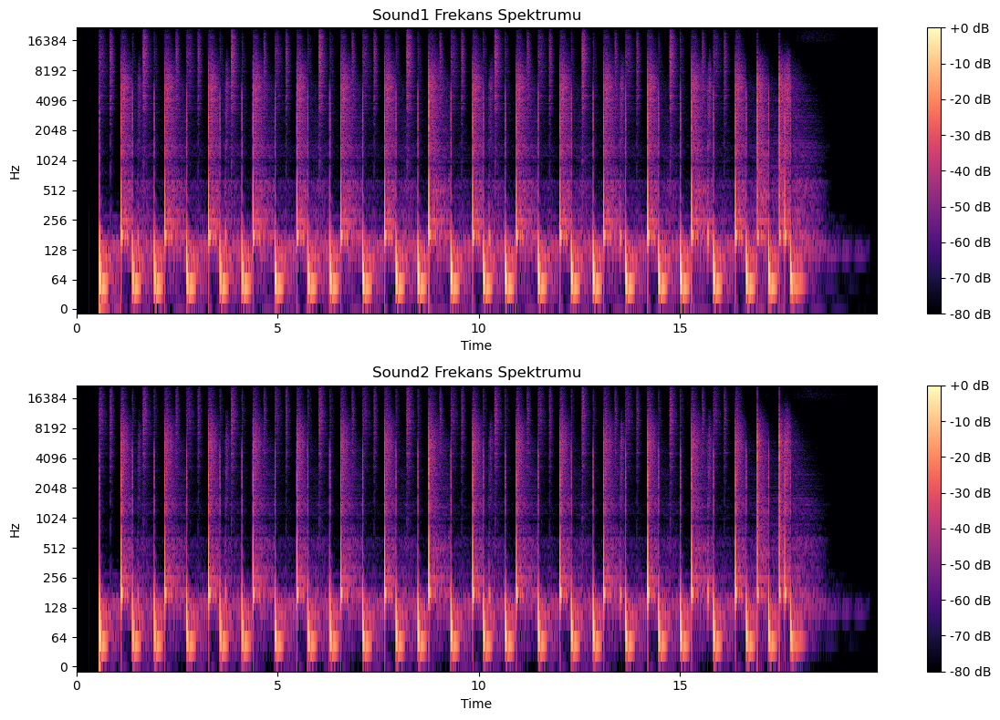

In [76]:
# FREKANS SPEKTRUMU KARŞILAŞTIRMASI

# Ses dosyaları üzerinde STFT uygulama ve desibel ölçeğine çevirme
S1 = librosa.amplitude_to_db(np.abs(librosa.stft(sound1)), ref=np.max)
S2 = librosa.amplitude_to_db(np.abs(librosa.stft(sound2)), ref=np.max)

# Grafik oluşturma
plt.figure(figsize=(12, 8))

# Birinci ses dosyasının spektrumu
plt.subplot(2, 1, 1)
librosa.display.specshow(S1, sr=sr1, y_axis='log', x_axis='time') # Spektrumu zaman ekseninde ve logaritmik frekans ölçeğinde görselleştirir.
plt.colorbar(format='%+2.0f dB') # Grafiğin yanına eklenen renk çubuğunda (colorbar) desibel değerlerini gösterir.
plt.title('Sound1 Frekans Spektrumu')

# İkinci ses dosyasının spektrumu
plt.subplot(2, 1, 2)
librosa.display.specshow(S2, sr=sr2, y_axis='log', x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Sound2 Frekans Spektrumu')

plt.tight_layout()
plt.show()

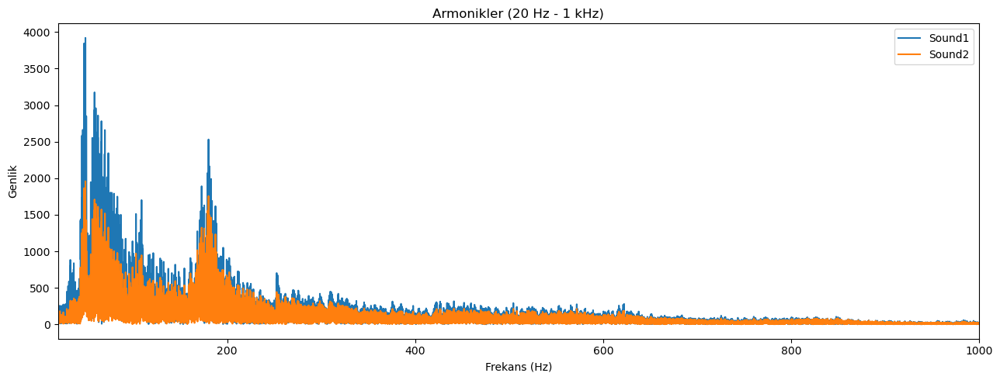

In [78]:
# ARMONİKLER

# Fourier Dönüşümü ile frekans spektrumu hesaplama
def plot_harmonics(signal, sr, title):
    # Fourier dönüşümünü al ve frekans spektrumunu elde et
    spectrum = np.fft.fft(signal)
    magnitude = np.abs(spectrum)
    freqs = np.fft.fftfreq(len(magnitude), 1/sr)
    
# Yalnızca pozitif frekansları al
    positive_freqs = freqs[:len(freqs)//2]
    positive_magnitude = magnitude[:len(magnitude)//2]

# Grafik çizimi
    plt.plot(positive_freqs, positive_magnitude, label=title)
    plt.xlabel("Frekans (Hz)")
    plt.ylabel("Genlik")
    plt.title("Armonikler (20 Hz - 1 kHz)")
    plt.legend()

# Grafik oluşturma
plt.figure(figsize=(25, 5))

# Sound1 ve Sound2 frekans spektrumlarını karşılaştır
plt.subplot(1, 2, 1)
plot_harmonics(sound1, sr1, "Sound1")
plt.xlim(20, 1000) # Frekans aralığını belirler

plt.subplot(1, 2, 1)
plot_harmonics(sound2, sr2, "Sound2")
plt.xlim(20, 1000) 

plt.tight_layout()
plt.show()

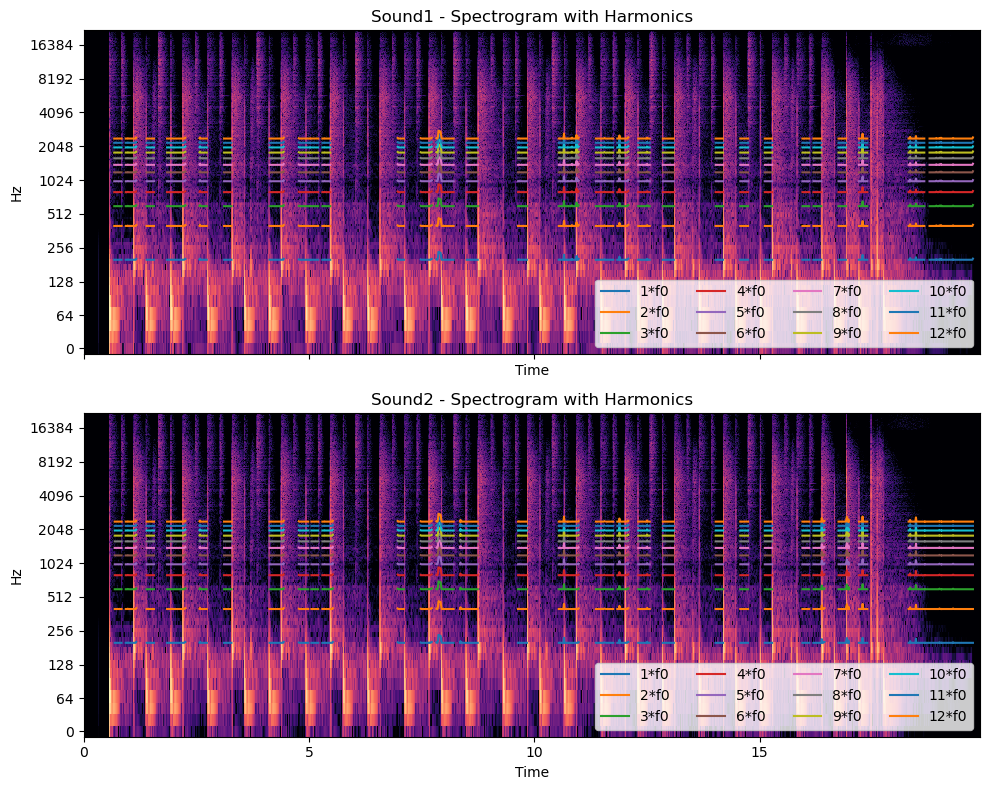

In [80]:
# HARMONIC CONTENT

# Sound1 ve Sound2 için temel frekans ve harmonik analizleri
f0_1, voicing_1, voicing_p1 = librosa.pyin(y=sound1, sr=sr1, fmin=200, fmax=700)
S1 = np.abs(librosa.stft(sound1))
freqs1 = librosa.fft_frequencies(sr=sr1)
harmonics = np.arange(1, 13)
f0_harm1 = librosa.f0_harmonics(S1, freqs=freqs1, f0=f0_1, harmonics=harmonics)

f0_2, voicing_2, voicing_p2 = librosa.pyin(y=sound2, sr=sr2, fmin=200, fmax=700)
S2 = np.abs(librosa.stft(sound2))
freqs2 = librosa.fft_frequencies(sr=sr2)
f0_harm2 = librosa.f0_harmonics(S2, freqs=freqs2, f0=f0_2, harmonics=harmonics)

# Grafik ayarları
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(10, 8))

# Sound1 için spektrogram ve harmonikler
librosa.display.specshow(librosa.amplitude_to_db(S1, ref=np.max), x_axis='time', y_axis='log', ax=ax[0], sr=sr1)
times1 = librosa.times_like(f0_1, sr=sr1)
for h in harmonics:
    ax[0].plot(times1, h * f0_1, label=f"{h}*f0")
ax[0].legend(ncols=4, loc='lower right')
ax[0].set(title="Sound1 - Spectrogram with Harmonics", ylabel="Hz")

# Sound2 için spektrogram ve harmonikler
librosa.display.specshow(librosa.amplitude_to_db(S2, ref=np.max), x_axis='time', y_axis='log', ax=ax[1], sr=sr2)
times2 = librosa.times_like(f0_2, sr=sr2)
for h in harmonics:
    ax[1].plot(times2, h * f0_2, label=f"{h}*f0")
ax[1].legend(ncols=4, loc='lower right')
ax[1].set(title="Sound2 - Spectrogram with Harmonics", ylabel="Hz")

plt.tight_layout()
plt.show()

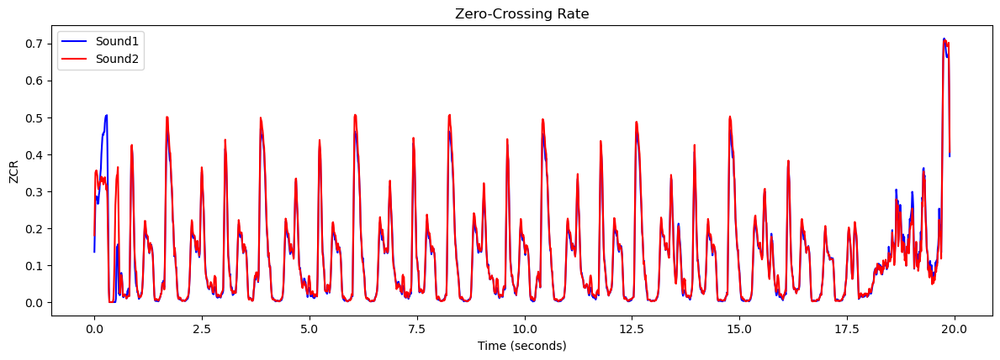

In [81]:
#ZERO-CROSSING RATE

# ZCR hesaplama
zcr_sound1 = librosa.feature.zero_crossing_rate(sound1)[0]
zcr_sound2 = librosa.feature.zero_crossing_rate(sound2)[0]

# Zaman ekseni oluşturma
t_sound1 = librosa.times_like(zcr_sound1, sr=sr1)
t_sound2 = librosa.times_like(zcr_sound2, sr=sr2)

# Grafik çizimi
plt.figure(figsize=(12, 8))

# Birinci ses dosyasının ZCR grafiği
plt.subplot(2, 1, 1)
plt.plot(t_sound1, zcr_sound1, color="blue", label="Sound1")
plt.title("Sound1")
plt.xlabel("Time (seconds)")
plt.ylabel("ZCR")
plt.legend()

# İkinci ses dosyasının ZCR grafiği
plt.subplot(2, 1, 1)
plt.plot(t_sound2, zcr_sound2, color="red", label="Sound2")
plt.title("Zero-Crossing Rate")
plt.xlabel("Time (seconds)")
plt.ylabel("ZCR")
plt.legend()

plt.tight_layout()
plt.show()

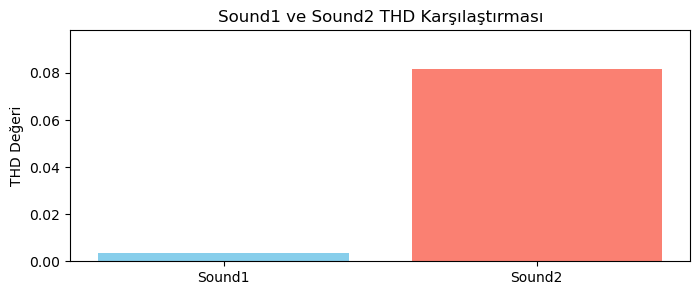

In [83]:
# TOTAL HARMONIC DISTORTION

# Harmonik Bozulma (THD) Analizi
def thd_analysis(signal, sr):
    ft = np.fft.fft(signal)
    magnitude = np.abs(ft)
    fundamental_freq = np.argmax(magnitude[:len(magnitude)//2])  # Temel frekans indeksi
    
# Harmonik frekanslar ve toplam bozulma oranını hesapla
    harmonics = [np.argmax(magnitude[n * fundamental_freq - 5 : n * fundamental_freq + 5])
                 for n in range(2, 6)]
    thd = sum(magnitude[harmonics]) / magnitude[fundamental_freq]
    return thd

# Sound1 ve Sound2 için THD değerlerini hesapla
thd_sound1 = thd_analysis(sound1, sr1)
thd_sound2 = thd_analysis(sound2, sr2)

# THD değerlerini karşılaştırmalı olarak gösterme
plt.figure(figsize=(8, 3))
plt.bar(["Sound1", "Sound2"], [thd_sound1, thd_sound2], color=['skyblue', 'salmon'])
plt.ylabel("THD Değeri")
plt.title("Sound1 ve Sound2 THD Karşılaştırması")
plt.ylim(0, max(thd_sound1, thd_sound2) * 1.2)  # Grafik sınırlarını belirle
plt.show()

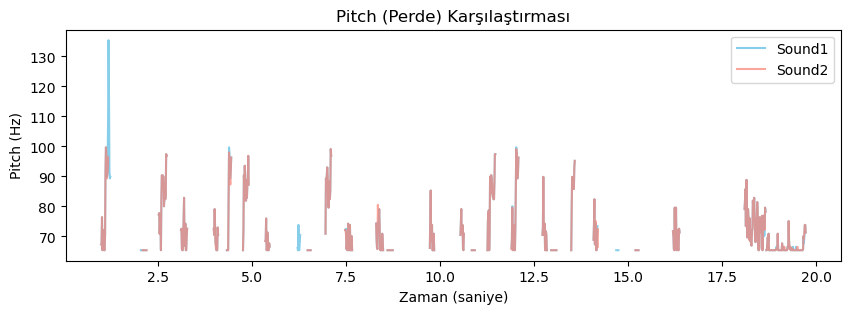

In [86]:
# PERDE DEĞİŞİMLERİ 

# Kompresörler sesin dinamiklerini değiştirdiğinden, sesin perde davranışında da ince değişiklikler yaratabilirler.

# Pitch analizi yapma (pYIN algoritması ile)
f0_1, voiced_flag1, voiced_probs1 = librosa.pyin(sound1, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7')) # C2 ve C7 arası analizi kapsar.
f0_2, voiced_flag2, voiced_probs2 = librosa.pyin(sound2, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))

# Zaman eksenini saniye olarak hesapla
time1 = librosa.times_like(f0_1, sr=sr1) # Zaman ekseni hesaplanıyor, böylece pitch analiz sonuçları zamanla ilişkilendirilebiliyor.
time2 = librosa.times_like(f0_2, sr=sr2)

# Pitch karşılaştırması
plt.figure(figsize=(10, 3))
plt.plot(time1, f0_1, label='Sound1', color='skyblue')
plt.plot(time2, f0_2, label='Sound2', color='salmon', alpha=0.7)
plt.title('Pitch (Perde) Karşılaştırması')
plt.xlabel('Zaman (saniye)')
plt.ylabel('Pitch (Hz)')
plt.legend()
plt.show()

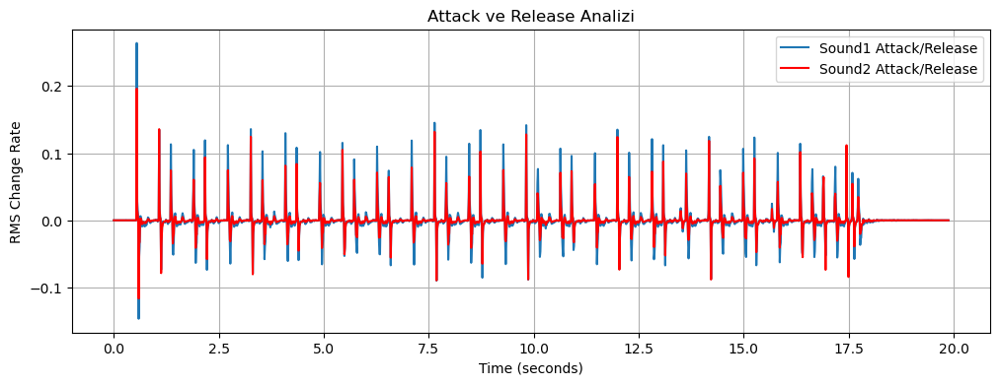

In [87]:
# ATTACK & RELEASE

# RMS değerlerini hesaplama (hop_length = 512)
hop_length = 512
rms1 = librosa.feature.rms(y=sound1, hop_length=hop_length)[0]
rms2 = librosa.feature.rms(y=sound2, hop_length=hop_length)[0]

# RMS farklarını hesaplama
delta_rms1 = np.diff(rms1)
delta_rms2 = np.diff(rms2)

# Zaman vektörlerini oluşturma
times1 = librosa.times_like(delta_rms1, sr=sr1, hop_length=hop_length)
times2 = librosa.times_like(delta_rms2, sr=sr2, hop_length=hop_length)

# Grafik
plt.figure(figsize=(12, 4))
plt.plot(times1, delta_rms1, label="Sound1 Attack/Release")
plt.plot(times2, delta_rms2, label="Sound2 Attack/Release", color='r')
plt.xlabel("Time (seconds)")
plt.ylabel("RMS Change Rate")
plt.legend()
plt.title("Attack ve Release Analizi")
plt.grid()
plt.show()

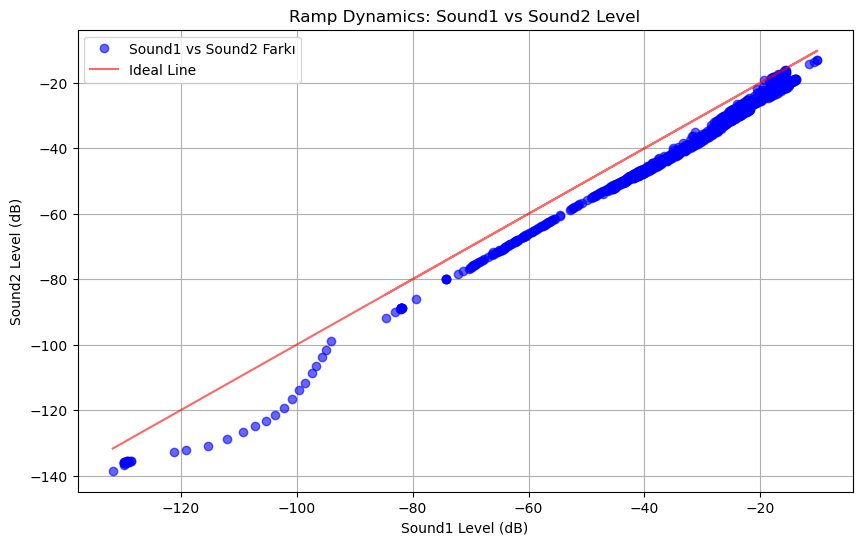

In [88]:
# DİNAMİK IN-OUT İLİŞKİSİ

# Genlik seviyelerini hesaplama (dBFS cinsinden)
def compute_rms_db(signal):
    rms = np.sqrt(np.mean(signal**2))
    db = 20 * np.log10(rms + 1e-9)  # Küçük bir değerle sıfır bölme hatası engellenir
    return db

# Giriş ve çıkış sinyal genliklerini küçük pencerelerle hesaplama
frame_size = 2048
hop_length = 512

# RMS hesaplama (sound1 ve sound2 için)
sound1_rms = librosa.feature.rms(y=sound1, frame_length=frame_size, hop_length=hop_length)
sound2_rms = librosa.feature.rms(y=sound2, frame_length=frame_size, hop_length=hop_length)

# RMS değerlerini dB'ye dönüştürme
sound1_db = 20 * np.log10(sound1_rms + 1e-9)
sound2_db = 20 * np.log10(sound2_rms + 1e-9)

# Görselleştirme: Ramp Grafiği (sound1 - sound2 Karşılaştırması)
plt.figure(figsize=(10, 6))

# sound1 için mavi, sound2 için turuncu renk
plt.plot(sound1_db[0], sound2_db[0], 'o', color='blue', alpha=0.6, label="Sound1 vs Sound2 Farkı")
plt.plot(sound1_db[0], sound1_db[0], '-', color='red', alpha=0.6, label="Ideal Line")  # İdeal 1:1 çizgisi

plt.title("Ramp Dynamics: Sound1 vs Sound2 Level")
plt.xlabel("Sound1 Level (dB)")
plt.ylabel("Sound2 Level (dB)")
plt.grid(True)
plt.legend()
plt.show()


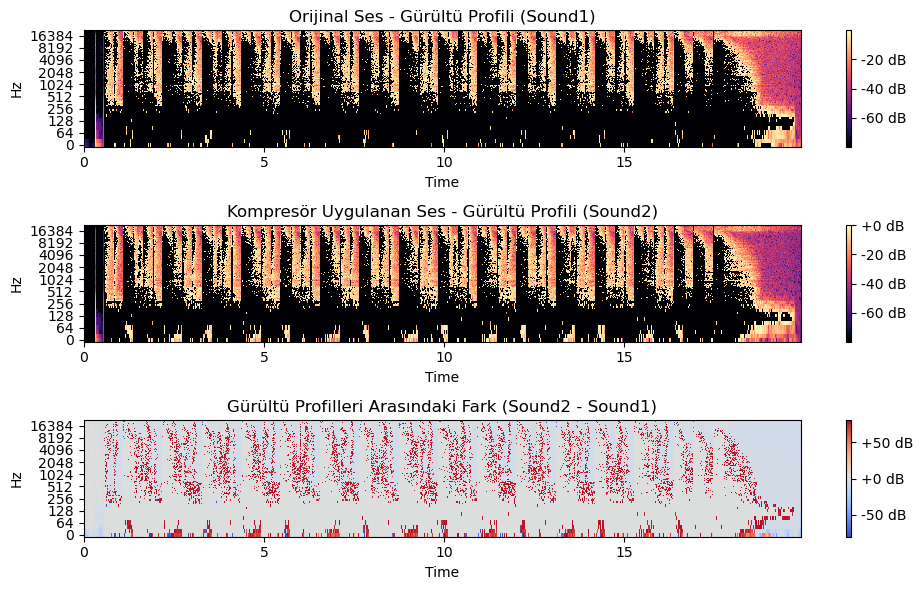

In [89]:
# GÜRÜLTÜ PROFİLİ

# Gürültü profili çıkarmak için STFT ve eşikleme
stft_sound1 = np.abs(librosa.stft(sound1))
stft_sound2 = np.abs(librosa.stft(sound2))

# Düşük enerji seviyelerindeki bileşenleri belirlemek için bir eşik değeri
noise_threshold = 0.1  # Düşük enerjili bileşenler için eşik

# Gürültü profilleri - düşük enerji bileşenlerini seçme
noise_profile1 = np.where(stft_sound1 < noise_threshold, stft_sound1, 0)
noise_profile2 = np.where(stft_sound2 < noise_threshold, stft_sound2, 0)

# Gürültü profillerini dB cinsinden dönüştürme
noise_profile1_db = librosa.amplitude_to_db(noise_profile1, ref=np.max)
noise_profile2_db = librosa.amplitude_to_db(noise_profile2, ref=np.max)

# Gürültü profilleri arasındaki farkı hesaplama
noise_difference = noise_profile2_db - noise_profile1_db

# Grafik çizimi
plt.figure(figsize=(10, 6))

# Sound1 Gürültü Profili
plt.subplot(3, 1, 1)
librosa.display.specshow(noise_profile1_db, sr=sr1, x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format='%+2.0f dB')
plt.title('Orijinal Ses - Gürültü Profili (Sound1)')

# Sound2 Gürültü Profili
plt.subplot(3, 1, 2)
librosa.display.specshow(noise_profile2_db, sr=sr2, x_axis='time', y_axis='log', cmap='magma')
plt.colorbar(format='%+2.0f dB')
plt.title('Kompresör Uygulanan Ses - Gürültü Profili (Sound2)')

# Gürültü Profilleri Arasındaki Fark
plt.subplot(3, 1, 3)
librosa.display.specshow(noise_difference, sr=sr1, x_axis='time', y_axis='log', cmap='coolwarm')
plt.colorbar(format='%+2.0f dB')
plt.title('Gürültü Profilleri Arasındaki Fark (Sound2 - Sound1)')

plt.tight_layout()
plt.show()